In [1]:
import numpy as np

acone=np.load('/data/private/SU/jh/GC_Data/ac.npy')
adone=np.load('/data/private/SU/jh/GC_Data/ad.npy')

cephimage=np.load('/data/private/SU/jh/GC_Data/cephimage.npy')

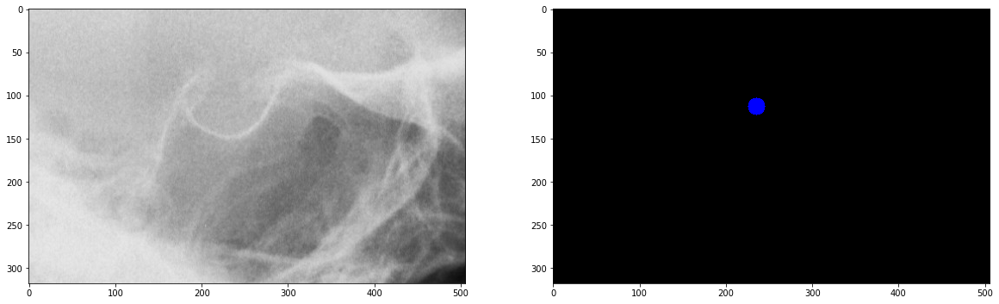

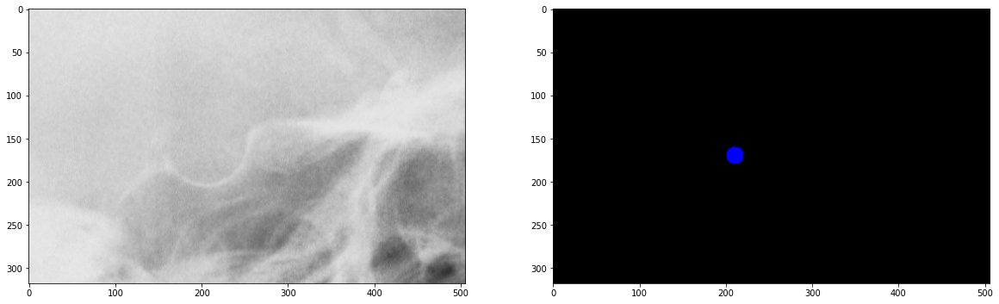

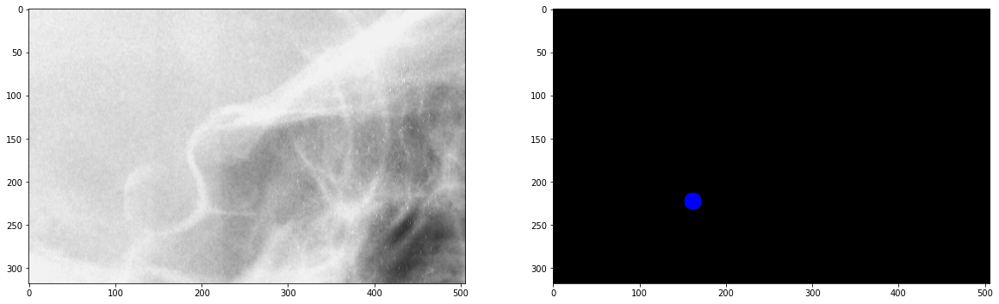

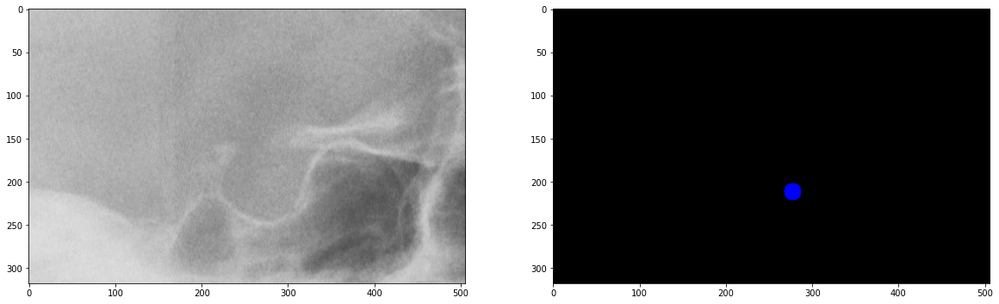

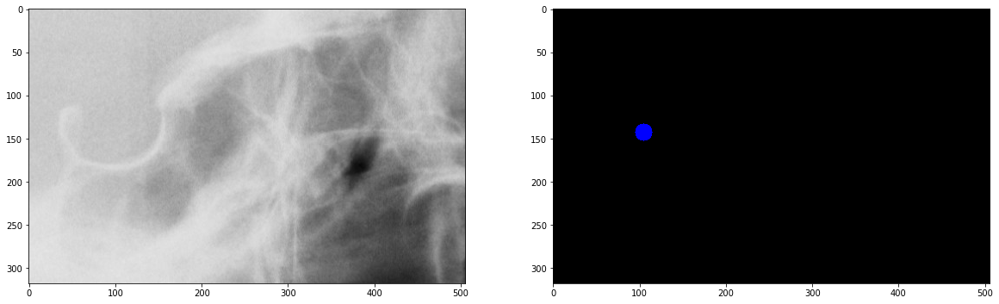

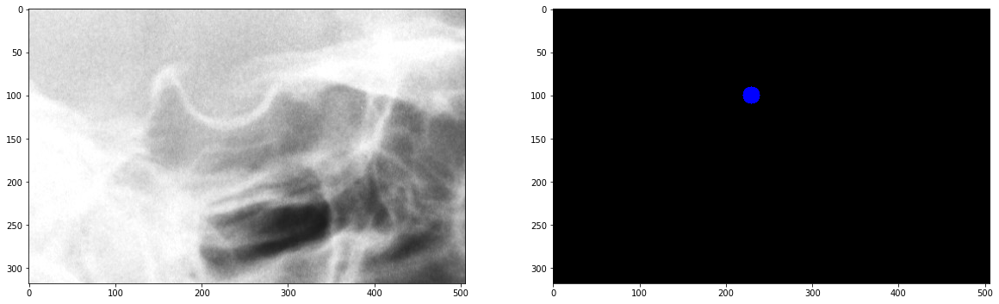

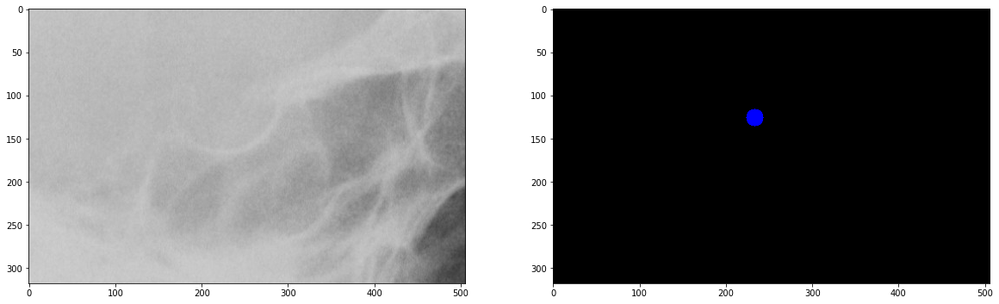

KeyboardInterrupt: 

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
for i in range(300):  
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(cephimage[i])
    plt.subplot(1, 2, 2)
    plt.imshow(acone[i])
    plt.show()

In [ ]:
import glob
import cv2
%matplotlib inline

file_type="bmp"
files=glob.glob("/data/private/SU/jh/GC_Data/RawImage/Test2Data"+"/*."+file_type)

a= []
for i in range(len(files)):   
    mask = cv2.imread(files[i])
    a.append(mask)
    


%matplotlib inline
import matplotlib.pyplot as plt

test=[]
for i in range(len(files)):  
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    subimge=a[i][883:1201, 600:1106]
    test.append(subimge)
    plt.imshow(test[i],'gray')

In [ ]:
import numpy as np
test=np.array(test)

np.save('/data/private/SU/jh/GC_Data/test',test)

In [3]:
testset=np.load('/data/private/SU/jh/GC_Data/test.npy')


In [4]:
testset.shape

(100, 318, 506, 3)

In [5]:
xroi=np.load('/data/private/SU/jh/GC_Data/x_mean.npy')
yroi=np.load('/data/private/SU/jh/GC_Data/y_mean.npy')

In [ ]:
xroi.shape

In [ ]:
yxroi=[]
for i in range(300):
    a=yroi[i],xroi[i]
    yxroi.append(a)
    print(yxroi[i],i)


In [ ]:
yxroi=np.array(yxroi)

np.save('/data/private/SU/jh/GC_Data/yxroi',yxroi)

In [6]:
yxroi=np.load('/data/private/SU/jh/GC_Data/yxroi.npy')

In [7]:
yxroi.shape

(300, 2)

In [8]:
import cv2
import os

import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
x_val=[]
y_val=[]

cephimage,x_val,yxroi,y_val = train_test_split(cephimage, yxroi, test_size =0.2)

In [9]:


cephimage = cephimage.astype('float32')/255
testset =testset.astype('float32')/255
x_val=x_val.astype('float32')/255



In [10]:
print(cephimage.shape)
print(x_val.shape)
print(yxroi.shape)
print(y_val.shape)

print(testset.shape)

(240, 318, 506, 3)
(60, 318, 506, 3)
(240, 2)
(60, 2)
(100, 318, 506, 3)


In [11]:
import numpy as np
from keras.utils import np_utils
from keras.models import Sequential, load_model
from keras.layers import Dense, Activation, Conv2D, MaxPooling2D, Flatten, Dropout, ZeroPadding2D
from keras.optimizers import SGD
from keras import backend as K
from keras.layers.advanced_activations import ELU
from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint, History

"""model = Sequential()
model.add(Conv2D(32, kernel_size=(4, 4), activation='relu', input_shape=(318, 506, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.05))

model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

model.add(Conv2D(128, kernel_size=(2, 2), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))


model.add(Conv2D(256, kernel_size=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))
model.add(Flatten())
#fc-1
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.3))
#fc-2
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(2, activation='linear'))
"""

model = Sequential()
model.add(Conv2D(32, (4, 4), input_shape=(318, 506,3)))
model.add(ELU(1.0))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

model.add(Conv2D(64, (3, 3)))
model.add(ELU(1.0))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(128, (2, 2)))
model.add(ELU(1.0))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(256, (1, 1)))
model.add(ELU(1.0))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(1000))
model.add(ELU(1.0))
model.add(Dropout(0.5))

model.add(Dense(1000))#선형으로 변경 
model.add(Activation('linear'))
model.add(Dropout(0.6))
model.add(Dense(2))

model.summary()


Using TensorFlow backend.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 315, 503, 32)      1568      
_________________________________________________________________
elu_1 (ELU)                  (None, 315, 503, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 157, 251, 32)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 157, 251, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 155, 249, 64)      18496     
_________________________________________________________________
elu_2 (ELU)                  (None, 155, 249, 64)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 77, 124, 64)       0         
__________

In [12]:
from keras.optimizers import Adam, SGD

In [13]:
model.compile(optimizer = Adam(lr = 1e-5), loss = 'mean_squared_error', metrics = ['accuracy'])

In [14]:
modelpath = "/data/private/SU/jh/GC_Data/tt/{epoch:02d}-{val_loss:.4f}.hdf5"
checkpointer = ModelCheckpoint(filepath = modelpath, monitor = "val_loss", verbose=1, save_best_only=True)
model.fit(cephimage,yxroi, batch_size=40, nb_epoch=2000, verbose=1,validation_data=[x_val, y_val], shuffle=True, callbacks = [checkpointer])

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:3: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  This is separate from the ipykernel package so we can avoid doing imports until


Train on 240 samples, validate on 60 samples
Epoch 1/2000
240/240 [==============================] - 8s 35ms/step - loss: 33509.8014 - acc: 0.6708 - val_loss: 34233.5299 - val_acc: 0.8000

Epoch 00001: val_loss improved from inf to 34233.52995, saving model to /data/private/SU/jh/GC_Data/tt/01-34233.5299.hdf5
Epoch 2/2000
240/240 [==============================] - 2s 10ms/step - loss: 25999.6849 - acc: 0.7667 - val_loss: 30427.0951 - val_acc: 0.8000

Epoch 00002: val_loss improved from 34233.52995 to 30427.09505, saving model to /data/private/SU/jh/GC_Data/tt/02-30427.0951.hdf5
Epoch 3/2000
240/240 [==============================] - 2s 10ms/step - loss: 19631.1654 - acc: 0.7250 - val_loss: 26690.1204 - val_acc: 0.8000

Epoch 00003: val_loss improved from 30427.09505 to 26690.12044, saving model to /data/private/SU/jh/GC_Data/tt/03-26690.1204.hdf5
Epoch 4/2000
240/240 [==============================] - 2s 10ms/step - loss: 13735.6444 - acc: 0.7167 - val_loss: 22876.1289 - val_acc: 0.800


Epoch 00038: val_loss did not improve from 10775.84440
Epoch 39/2000
240/240 [==============================] - 2s 10ms/step - loss: 2546.9710 - acc: 0.7917 - val_loss: 12200.9134 - val_acc: 0.8000

Epoch 00039: val_loss did not improve from 10775.84440
Epoch 40/2000
240/240 [==============================] - 3s 10ms/step - loss: 2640.9852 - acc: 0.7875 - val_loss: 12102.7793 - val_acc: 0.8000

Epoch 00040: val_loss did not improve from 10775.84440
Epoch 41/2000
240/240 [==============================] - 2s 10ms/step - loss: 2652.3525 - acc: 0.7958 - val_loss: 12187.5960 - val_acc: 0.8000

Epoch 00041: val_loss did not improve from 10775.84440
Epoch 42/2000
240/240 [==============================] - 2s 10ms/step - loss: 2588.4560 - acc: 0.8000 - val_loss: 12342.8317 - val_acc: 0.8000

Epoch 00042: val_loss did not improve from 10775.84440
Epoch 43/2000
240/240 [==============================] - 2s 10ms/step - loss: 2832.9523 - acc: 0.7833 - val_loss: 12453.6540 - val_acc: 0.8000

Epoc

240/240 [==============================] - 3s 10ms/step - loss: 2412.4921 - acc: 0.8000 - val_loss: 11723.5107 - val_acc: 0.8000

Epoch 00080: val_loss did not improve from 10775.84440
Epoch 81/2000
240/240 [==============================] - 2s 10ms/step - loss: 2462.8292 - acc: 0.7958 - val_loss: 11755.6152 - val_acc: 0.8000

Epoch 00081: val_loss did not improve from 10775.84440
Epoch 82/2000
240/240 [==============================] - 2s 10ms/step - loss: 2478.5810 - acc: 0.8042 - val_loss: 11604.9310 - val_acc: 0.8000

Epoch 00082: val_loss did not improve from 10775.84440
Epoch 83/2000
240/240 [==============================] - 2s 10ms/step - loss: 2548.7719 - acc: 0.7958 - val_loss: 11716.3294 - val_acc: 0.8000

Epoch 00083: val_loss did not improve from 10775.84440
Epoch 84/2000
240/240 [==============================] - 2s 10ms/step - loss: 2508.5719 - acc: 0.8000 - val_loss: 11759.7731 - val_acc: 0.8000

Epoch 00084: val_loss did not improve from 10775.84440
Epoch 85/2000
240/2

Epoch 121/2000
240/240 [==============================] - 2s 10ms/step - loss: 2470.5416 - acc: 0.8000 - val_loss: 10793.8242 - val_acc: 0.8000

Epoch 00121: val_loss did not improve from 10534.14453
Epoch 122/2000
240/240 [==============================] - 2s 10ms/step - loss: 2251.0236 - acc: 0.8000 - val_loss: 10923.6387 - val_acc: 0.8000

Epoch 00122: val_loss did not improve from 10534.14453
Epoch 123/2000
240/240 [==============================] - 2s 10ms/step - loss: 2261.8978 - acc: 0.8042 - val_loss: 10718.7230 - val_acc: 0.8000

Epoch 00123: val_loss did not improve from 10534.14453
Epoch 124/2000
240/240 [==============================] - 2s 10ms/step - loss: 2237.2833 - acc: 0.8125 - val_loss: 10466.2630 - val_acc: 0.8000

Epoch 00124: val_loss improved from 10534.14453 to 10466.26302, saving model to /data/private/SU/jh/GC_Data/tt/124-10466.2630.hdf5
Epoch 125/2000
240/240 [==============================] - 2s 10ms/step - loss: 2256.2222 - acc: 0.7875 - val_loss: 10358.611

240/240 [==============================] - 2s 10ms/step - loss: 2111.7622 - acc: 0.7958 - val_loss: 9766.4320 - val_acc: 0.8000

Epoch 00157: val_loss did not improve from 9553.09082
Epoch 158/2000
240/240 [==============================] - 2s 10ms/step - loss: 2024.7865 - acc: 0.8125 - val_loss: 9480.7448 - val_acc: 0.8000

Epoch 00158: val_loss improved from 9553.09082 to 9480.74479, saving model to /data/private/SU/jh/GC_Data/tt/158-9480.7448.hdf5
Epoch 159/2000
240/240 [==============================] - 3s 11ms/step - loss: 2061.4567 - acc: 0.8000 - val_loss: 9382.1917 - val_acc: 0.8000

Epoch 00159: val_loss improved from 9480.74479 to 9382.19173, saving model to /data/private/SU/jh/GC_Data/tt/159-9382.1917.hdf5
Epoch 160/2000
240/240 [==============================] - 2s 10ms/step - loss: 2056.3762 - acc: 0.8042 - val_loss: 9253.1162 - val_acc: 0.8000

Epoch 00160: val_loss improved from 9382.19173 to 9253.11621, saving model to /data/private/SU/jh/GC_Data/tt/160-9253.1162.hdf5
E

240/240 [==============================] - 2s 10ms/step - loss: 1954.2269 - acc: 0.8042 - val_loss: 8320.3568 - val_acc: 0.8000

Epoch 00195: val_loss did not improve from 8176.16048
Epoch 196/2000
240/240 [==============================] - 2s 10ms/step - loss: 1931.7863 - acc: 0.8000 - val_loss: 8328.3250 - val_acc: 0.8000

Epoch 00196: val_loss did not improve from 8176.16048
Epoch 197/2000
240/240 [==============================] - 2s 10ms/step - loss: 1964.2128 - acc: 0.8083 - val_loss: 8020.4132 - val_acc: 0.8000

Epoch 00197: val_loss improved from 8176.16048 to 8020.41325, saving model to /data/private/SU/jh/GC_Data/tt/197-8020.4132.hdf5
Epoch 198/2000
240/240 [==============================] - 3s 11ms/step - loss: 1943.7964 - acc: 0.8000 - val_loss: 8117.1935 - val_acc: 0.8000

Epoch 00198: val_loss did not improve from 8020.41325
Epoch 199/2000
240/240 [==============================] - 2s 10ms/step - loss: 1959.0958 - acc: 0.7958 - val_loss: 8378.5752 - val_acc: 0.8000

Epoch

240/240 [==============================] - 2s 10ms/step - loss: 1906.6640 - acc: 0.8083 - val_loss: 6995.6356 - val_acc: 0.8000

Epoch 00233: val_loss did not improve from 6982.51204
Epoch 234/2000
240/240 [==============================] - 2s 10ms/step - loss: 1760.7067 - acc: 0.8083 - val_loss: 7205.1172 - val_acc: 0.8000

Epoch 00234: val_loss did not improve from 6982.51204
Epoch 235/2000
240/240 [==============================] - 2s 10ms/step - loss: 1784.1625 - acc: 0.8083 - val_loss: 7098.6413 - val_acc: 0.8000

Epoch 00235: val_loss did not improve from 6982.51204
Epoch 236/2000
240/240 [==============================] - 2s 10ms/step - loss: 1806.7425 - acc: 0.8250 - val_loss: 7012.9411 - val_acc: 0.8000

Epoch 00236: val_loss did not improve from 6982.51204
Epoch 237/2000
240/240 [==============================] - 2s 10ms/step - loss: 1761.9819 - acc: 0.8292 - val_loss: 7008.8241 - val_acc: 0.8000

Epoch 00237: val_loss did not improve from 6982.51204
Epoch 238/2000
240/240 [=


Epoch 00272: val_loss did not improve from 5858.22559
Epoch 273/2000
240/240 [==============================] - 2s 10ms/step - loss: 1746.6235 - acc: 0.8292 - val_loss: 6280.4105 - val_acc: 0.8000

Epoch 00273: val_loss did not improve from 5858.22559
Epoch 274/2000
240/240 [==============================] - 2s 10ms/step - loss: 1669.6358 - acc: 0.8167 - val_loss: 5873.7523 - val_acc: 0.8000

Epoch 00274: val_loss did not improve from 5858.22559
Epoch 275/2000
240/240 [==============================] - 2s 10ms/step - loss: 1585.3935 - acc: 0.8417 - val_loss: 5703.4159 - val_acc: 0.8000

Epoch 00275: val_loss improved from 5858.22559 to 5703.41585, saving model to /data/private/SU/jh/GC_Data/tt/275-5703.4159.hdf5
Epoch 276/2000
240/240 [==============================] - 3s 11ms/step - loss: 1588.3858 - acc: 0.8042 - val_loss: 6301.1738 - val_acc: 0.8000

Epoch 00276: val_loss did not improve from 5703.41585
Epoch 277/2000
240/240 [==============================] - 2s 10ms/step - loss: 

240/240 [==============================] - 2s 10ms/step - loss: 1580.3915 - acc: 0.8208 - val_loss: 5381.6341 - val_acc: 0.8000

Epoch 00311: val_loss did not improve from 4892.76929
Epoch 312/2000
240/240 [==============================] - 2s 10ms/step - loss: 1643.9951 - acc: 0.8458 - val_loss: 5175.6823 - val_acc: 0.7833

Epoch 00312: val_loss did not improve from 4892.76929
Epoch 313/2000
240/240 [==============================] - 2s 10ms/step - loss: 1549.2252 - acc: 0.8000 - val_loss: 5310.4738 - val_acc: 0.7833

Epoch 00313: val_loss did not improve from 4892.76929
Epoch 314/2000
240/240 [==============================] - 2s 10ms/step - loss: 1654.9237 - acc: 0.8042 - val_loss: 5276.6924 - val_acc: 0.8000

Epoch 00314: val_loss did not improve from 4892.76929
Epoch 315/2000
240/240 [==============================] - 2s 10ms/step - loss: 1555.9038 - acc: 0.8125 - val_loss: 5131.8304 - val_acc: 0.8000

Epoch 00315: val_loss did not improve from 4892.76929
Epoch 316/2000
240/240 [=

Epoch 350/2000
240/240 [==============================] - 3s 11ms/step - loss: 1494.0323 - acc: 0.8208 - val_loss: 4701.2677 - val_acc: 0.8000

Epoch 00350: val_loss did not improve from 4130.85246
Epoch 351/2000
240/240 [==============================] - 2s 10ms/step - loss: 1511.2433 - acc: 0.8542 - val_loss: 4285.4761 - val_acc: 0.7833

Epoch 00351: val_loss did not improve from 4130.85246
Epoch 352/2000
240/240 [==============================] - 3s 11ms/step - loss: 1438.1140 - acc: 0.8167 - val_loss: 4637.3047 - val_acc: 0.7833

Epoch 00352: val_loss did not improve from 4130.85246
Epoch 353/2000
240/240 [==============================] - 2s 10ms/step - loss: 1492.8916 - acc: 0.8458 - val_loss: 4164.3280 - val_acc: 0.7833

Epoch 00353: val_loss did not improve from 4130.85246
Epoch 354/2000
240/240 [==============================] - 2s 10ms/step - loss: 1578.5186 - acc: 0.8292 - val_loss: 4624.1271 - val_acc: 0.7833

Epoch 00354: val_loss did not improve from 4130.85246
Epoch 355/

240/240 [==============================] - 2s 10ms/step - loss: 1425.4136 - acc: 0.8542 - val_loss: 3932.2654 - val_acc: 0.7833

Epoch 00389: val_loss did not improve from 3676.66374
Epoch 390/2000
240/240 [==============================] - 2s 10ms/step - loss: 1617.3778 - acc: 0.8250 - val_loss: 3604.7479 - val_acc: 0.8333

Epoch 00390: val_loss improved from 3676.66374 to 3604.74788, saving model to /data/private/SU/jh/GC_Data/tt/390-3604.7479.hdf5
Epoch 391/2000
240/240 [==============================] - 2s 10ms/step - loss: 1373.4763 - acc: 0.8583 - val_loss: 3982.4006 - val_acc: 0.8000

Epoch 00391: val_loss did not improve from 3604.74788
Epoch 392/2000
240/240 [==============================] - 2s 10ms/step - loss: 1454.6901 - acc: 0.8458 - val_loss: 3695.9601 - val_acc: 0.8000

Epoch 00392: val_loss did not improve from 3604.74788
Epoch 393/2000
240/240 [==============================] - 2s 10ms/step - loss: 1454.0275 - acc: 0.8375 - val_loss: 3727.5174 - val_acc: 0.8000

Epoch


Epoch 00428: val_loss did not improve from 3257.11865
Epoch 429/2000
240/240 [==============================] - 2s 10ms/step - loss: 1328.9567 - acc: 0.8458 - val_loss: 3396.2817 - val_acc: 0.8667

Epoch 00429: val_loss did not improve from 3257.11865
Epoch 430/2000
240/240 [==============================] - 2s 10ms/step - loss: 1413.8658 - acc: 0.8250 - val_loss: 3259.6097 - val_acc: 0.8333

Epoch 00430: val_loss did not improve from 3257.11865
Epoch 431/2000
240/240 [==============================] - 2s 10ms/step - loss: 1317.9226 - acc: 0.8292 - val_loss: 3264.3844 - val_acc: 0.8333

Epoch 00431: val_loss did not improve from 3257.11865
Epoch 432/2000
240/240 [==============================] - 2s 10ms/step - loss: 1369.5015 - acc: 0.8292 - val_loss: 3352.9021 - val_acc: 0.8667

Epoch 00432: val_loss did not improve from 3257.11865
Epoch 433/2000
240/240 [==============================] - 3s 11ms/step - loss: 1507.6640 - acc: 0.8417 - val_loss: 3304.0537 - val_acc: 0.8500

Epoch 004

240/240 [==============================] - 2s 10ms/step - loss: 1322.3507 - acc: 0.8333 - val_loss: 2907.7373 - val_acc: 0.8667

Epoch 00468: val_loss did not improve from 2833.09131
Epoch 469/2000
240/240 [==============================] - 2s 10ms/step - loss: 1340.3742 - acc: 0.8208 - val_loss: 3053.8236 - val_acc: 0.8500

Epoch 00469: val_loss did not improve from 2833.09131
Epoch 470/2000
240/240 [==============================] - 2s 10ms/step - loss: 1359.9805 - acc: 0.8125 - val_loss: 2910.1568 - val_acc: 0.8667

Epoch 00470: val_loss did not improve from 2833.09131
Epoch 471/2000
240/240 [==============================] - 2s 10ms/step - loss: 1415.8113 - acc: 0.8375 - val_loss: 2889.8731 - val_acc: 0.8667

Epoch 00471: val_loss did not improve from 2833.09131
Epoch 472/2000
240/240 [==============================] - 2s 10ms/step - loss: 1278.2511 - acc: 0.8375 - val_loss: 2734.2248 - val_acc: 0.8667

Epoch 00472: val_loss improved from 2833.09131 to 2734.22477, saving model to /

240/240 [==============================] - 2s 10ms/step - loss: 1395.8074 - acc: 0.8208 - val_loss: 2577.9103 - val_acc: 0.8500

Epoch 00508: val_loss did not improve from 2504.81925
Epoch 509/2000
240/240 [==============================] - 2s 10ms/step - loss: 1397.3564 - acc: 0.8417 - val_loss: 2546.7980 - val_acc: 0.8667

Epoch 00509: val_loss did not improve from 2504.81925
Epoch 510/2000
240/240 [==============================] - 2s 10ms/step - loss: 1315.8180 - acc: 0.8375 - val_loss: 2715.6208 - val_acc: 0.8667

Epoch 00510: val_loss did not improve from 2504.81925
Epoch 511/2000
240/240 [==============================] - 2s 10ms/step - loss: 1374.1996 - acc: 0.8250 - val_loss: 2539.1147 - val_acc: 0.8333

Epoch 00511: val_loss did not improve from 2504.81925
Epoch 512/2000
240/240 [==============================] - 2s 10ms/step - loss: 1406.4141 - acc: 0.8250 - val_loss: 2627.3905 - val_acc: 0.8500

Epoch 00512: val_loss did not improve from 2504.81925
Epoch 513/2000
240/240 [=


Epoch 00548: val_loss did not improve from 2317.20223
Epoch 549/2000
240/240 [==============================] - 2s 10ms/step - loss: 1265.9149 - acc: 0.8375 - val_loss: 2403.1510 - val_acc: 0.8333

Epoch 00549: val_loss did not improve from 2317.20223
Epoch 550/2000
240/240 [==============================] - 2s 10ms/step - loss: 1237.1668 - acc: 0.8583 - val_loss: 2464.3812 - val_acc: 0.7833

Epoch 00550: val_loss did not improve from 2317.20223
Epoch 551/2000
240/240 [==============================] - 2s 10ms/step - loss: 1266.5523 - acc: 0.8125 - val_loss: 2441.9098 - val_acc: 0.8333

Epoch 00551: val_loss did not improve from 2317.20223
Epoch 552/2000
240/240 [==============================] - 2s 10ms/step - loss: 1343.8163 - acc: 0.8458 - val_loss: 2417.5457 - val_acc: 0.8333

Epoch 00552: val_loss did not improve from 2317.20223
Epoch 553/2000
240/240 [==============================] - 2s 10ms/step - loss: 1286.9892 - acc: 0.8458 - val_loss: 2419.7887 - val_acc: 0.7833

Epoch 005

240/240 [==============================] - 2s 10ms/step - loss: 1211.0165 - acc: 0.8292 - val_loss: 2283.8510 - val_acc: 0.7833

Epoch 00589: val_loss did not improve from 2244.21212
Epoch 590/2000
240/240 [==============================] - 2s 10ms/step - loss: 1293.0836 - acc: 0.8417 - val_loss: 2333.6163 - val_acc: 0.7833

Epoch 00590: val_loss did not improve from 2244.21212
Epoch 591/2000
240/240 [==============================] - 2s 10ms/step - loss: 1230.8442 - acc: 0.8542 - val_loss: 2322.0942 - val_acc: 0.7667

Epoch 00591: val_loss did not improve from 2244.21212
Epoch 592/2000
240/240 [==============================] - 2s 10ms/step - loss: 1302.1807 - acc: 0.8250 - val_loss: 2287.7471 - val_acc: 0.8333

Epoch 00592: val_loss did not improve from 2244.21212
Epoch 593/2000
240/240 [==============================] - 2s 10ms/step - loss: 1216.5323 - acc: 0.8792 - val_loss: 2411.2607 - val_acc: 0.7833

Epoch 00593: val_loss did not improve from 2244.21212
Epoch 594/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1287.2949 - acc: 0.8625 - val_loss: 2186.0601 - val_acc: 0.7667

Epoch 00629: val_loss did not improve from 2166.98169
Epoch 630/2000
240/240 [==============================] - 2s 10ms/step - loss: 1285.3270 - acc: 0.8542 - val_loss: 2259.2686 - val_acc: 0.7167

Epoch 00630: val_loss did not improve from 2166.98169
Epoch 631/2000
240/240 [==============================] - 2s 10ms/step - loss: 1318.5704 - acc: 0.8292 - val_loss: 2202.3810 - val_acc: 0.7667

Epoch 00631: val_loss did not improve from 2166.98169
Epoch 632/2000
240/240 [==============================] - 3s 10ms/step - loss: 1184.9346 - acc: 0.8500 - val_loss: 2232.2113 - val_acc: 0.7667

Epoch 00632: val_loss did not improve from 2166.98169
Epoch 633/2000
240/240 [==============================] - 2s 10ms/step - loss: 1276.1672 - acc: 0.8458 - val_loss: 2212.1490 - val_acc: 0.7667

Epoch 00633: val_loss did not improve from 2166.98169
Epoch 634/2000
240/240 [=


Epoch 00669: val_loss did not improve from 2108.50557
Epoch 670/2000
240/240 [==============================] - 2s 10ms/step - loss: 1221.5125 - acc: 0.8708 - val_loss: 2132.3927 - val_acc: 0.7667

Epoch 00670: val_loss did not improve from 2108.50557
Epoch 671/2000
240/240 [==============================] - 2s 10ms/step - loss: 1215.2506 - acc: 0.8708 - val_loss: 2157.3376 - val_acc: 0.7667

Epoch 00671: val_loss did not improve from 2108.50557
Epoch 672/2000
240/240 [==============================] - 2s 10ms/step - loss: 1375.5065 - acc: 0.8208 - val_loss: 2321.4820 - val_acc: 0.7167

Epoch 00672: val_loss did not improve from 2108.50557
Epoch 673/2000
240/240 [==============================] - 2s 10ms/step - loss: 1366.2184 - acc: 0.8458 - val_loss: 2146.2854 - val_acc: 0.7667

Epoch 00673: val_loss did not improve from 2108.50557
Epoch 674/2000
240/240 [==============================] - 2s 10ms/step - loss: 1343.5159 - acc: 0.8250 - val_loss: 2175.2207 - val_acc: 0.7667

Epoch 006

240/240 [==============================] - 2s 10ms/step - loss: 1216.2688 - acc: 0.8292 - val_loss: 2147.9344 - val_acc: 0.7500

Epoch 00711: val_loss did not improve from 2093.00724
Epoch 712/2000
240/240 [==============================] - 2s 10ms/step - loss: 1195.9357 - acc: 0.8083 - val_loss: 2231.2182 - val_acc: 0.7167

Epoch 00712: val_loss did not improve from 2093.00724
Epoch 713/2000
240/240 [==============================] - 2s 10ms/step - loss: 1353.4317 - acc: 0.8417 - val_loss: 2137.7124 - val_acc: 0.7333

Epoch 00713: val_loss did not improve from 2093.00724
Epoch 714/2000
240/240 [==============================] - 2s 10ms/step - loss: 1222.2207 - acc: 0.8500 - val_loss: 2241.7694 - val_acc: 0.7500

Epoch 00714: val_loss did not improve from 2093.00724
Epoch 715/2000
240/240 [==============================] - 2s 10ms/step - loss: 1319.2291 - acc: 0.8625 - val_loss: 2193.2834 - val_acc: 0.7000

Epoch 00715: val_loss did not improve from 2093.00724
Epoch 716/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1145.2130 - acc: 0.8458 - val_loss: 2205.0411 - val_acc: 0.7333

Epoch 00752: val_loss did not improve from 2093.00724
Epoch 753/2000
240/240 [==============================] - 2s 10ms/step - loss: 1231.6036 - acc: 0.8542 - val_loss: 2186.2361 - val_acc: 0.7000

Epoch 00753: val_loss did not improve from 2093.00724
Epoch 754/2000
240/240 [==============================] - 2s 10ms/step - loss: 1115.9228 - acc: 0.8333 - val_loss: 2174.1733 - val_acc: 0.7167

Epoch 00754: val_loss did not improve from 2093.00724
Epoch 755/2000
240/240 [==============================] - 2s 10ms/step - loss: 1144.2456 - acc: 0.8375 - val_loss: 2157.4838 - val_acc: 0.7333

Epoch 00755: val_loss did not improve from 2093.00724
Epoch 756/2000
240/240 [==============================] - 2s 10ms/step - loss: 1202.2273 - acc: 0.8417 - val_loss: 2164.4715 - val_acc: 0.7333

Epoch 00756: val_loss did not improve from 2093.00724
Epoch 757/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1184.0765 - acc: 0.8542 - val_loss: 2122.6548 - val_acc: 0.7333

Epoch 00793: val_loss did not improve from 2093.00724
Epoch 794/2000
240/240 [==============================] - 2s 10ms/step - loss: 1189.5697 - acc: 0.8625 - val_loss: 2176.8235 - val_acc: 0.7000

Epoch 00794: val_loss did not improve from 2093.00724
Epoch 795/2000
240/240 [==============================] - 2s 10ms/step - loss: 1233.1990 - acc: 0.8375 - val_loss: 2161.7860 - val_acc: 0.7000

Epoch 00795: val_loss did not improve from 2093.00724
Epoch 796/2000
240/240 [==============================] - 2s 10ms/step - loss: 1272.7717 - acc: 0.8417 - val_loss: 2163.1641 - val_acc: 0.7333

Epoch 00796: val_loss did not improve from 2093.00724
Epoch 797/2000
240/240 [==============================] - 2s 10ms/step - loss: 1223.2801 - acc: 0.8542 - val_loss: 2204.8245 - val_acc: 0.7000

Epoch 00797: val_loss did not improve from 2093.00724
Epoch 798/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1225.5913 - acc: 0.8167 - val_loss: 2145.1230 - val_acc: 0.7000

Epoch 00834: val_loss did not improve from 2093.00724
Epoch 835/2000
240/240 [==============================] - 2s 10ms/step - loss: 1227.1954 - acc: 0.8625 - val_loss: 2262.1484 - val_acc: 0.6833

Epoch 00835: val_loss did not improve from 2093.00724
Epoch 836/2000
240/240 [==============================] - 2s 10ms/step - loss: 1234.9872 - acc: 0.8500 - val_loss: 2246.8857 - val_acc: 0.6833

Epoch 00836: val_loss did not improve from 2093.00724
Epoch 837/2000
240/240 [==============================] - 2s 10ms/step - loss: 1157.5562 - acc: 0.8333 - val_loss: 2178.8579 - val_acc: 0.7000

Epoch 00837: val_loss did not improve from 2093.00724
Epoch 838/2000
240/240 [==============================] - 2s 10ms/step - loss: 1173.1777 - acc: 0.8375 - val_loss: 2209.5909 - val_acc: 0.7000

Epoch 00838: val_loss did not improve from 2093.00724
Epoch 839/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1253.3295 - acc: 0.8583 - val_loss: 2170.7600 - val_acc: 0.6833

Epoch 00875: val_loss did not improve from 2093.00724
Epoch 876/2000
240/240 [==============================] - 2s 10ms/step - loss: 1227.0907 - acc: 0.8583 - val_loss: 2250.8465 - val_acc: 0.6833

Epoch 00876: val_loss did not improve from 2093.00724
Epoch 877/2000
240/240 [==============================] - 2s 10ms/step - loss: 1284.5610 - acc: 0.8542 - val_loss: 2236.6753 - val_acc: 0.6833

Epoch 00877: val_loss did not improve from 2093.00724
Epoch 878/2000
240/240 [==============================] - 2s 10ms/step - loss: 1115.0588 - acc: 0.8292 - val_loss: 2198.8809 - val_acc: 0.7000

Epoch 00878: val_loss did not improve from 2093.00724
Epoch 879/2000
240/240 [==============================] - 2s 10ms/step - loss: 1279.3048 - acc: 0.8375 - val_loss: 2251.0564 - val_acc: 0.7000

Epoch 00879: val_loss did not improve from 2093.00724
Epoch 880/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1187.9942 - acc: 0.8542 - val_loss: 2296.6266 - val_acc: 0.6500

Epoch 00916: val_loss did not improve from 2093.00724
Epoch 917/2000
240/240 [==============================] - 2s 10ms/step - loss: 1176.4030 - acc: 0.8625 - val_loss: 2268.7758 - val_acc: 0.6500

Epoch 00917: val_loss did not improve from 2093.00724
Epoch 918/2000
240/240 [==============================] - 2s 10ms/step - loss: 1193.7013 - acc: 0.8542 - val_loss: 2220.2838 - val_acc: 0.7000

Epoch 00918: val_loss did not improve from 2093.00724
Epoch 919/2000
240/240 [==============================] - 2s 10ms/step - loss: 1286.2213 - acc: 0.8417 - val_loss: 2245.5386 - val_acc: 0.7000

Epoch 00919: val_loss did not improve from 2093.00724
Epoch 920/2000
240/240 [==============================] - 2s 10ms/step - loss: 1153.0952 - acc: 0.8542 - val_loss: 2241.8151 - val_acc: 0.6667

Epoch 00920: val_loss did not improve from 2093.00724
Epoch 921/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1155.1045 - acc: 0.8500 - val_loss: 2263.6326 - val_acc: 0.7000

Epoch 00957: val_loss did not improve from 2093.00724
Epoch 958/2000
240/240 [==============================] - 2s 10ms/step - loss: 1094.2541 - acc: 0.8625 - val_loss: 2331.9244 - val_acc: 0.6167

Epoch 00958: val_loss did not improve from 2093.00724
Epoch 959/2000
240/240 [==============================] - 2s 10ms/step - loss: 1131.6230 - acc: 0.8625 - val_loss: 2347.6523 - val_acc: 0.6500

Epoch 00959: val_loss did not improve from 2093.00724
Epoch 960/2000
240/240 [==============================] - 2s 10ms/step - loss: 1214.5595 - acc: 0.8375 - val_loss: 2197.7008 - val_acc: 0.7000

Epoch 00960: val_loss did not improve from 2093.00724
Epoch 961/2000
240/240 [==============================] - 2s 10ms/step - loss: 1126.8402 - acc: 0.8583 - val_loss: 2285.6134 - val_acc: 0.6500

Epoch 00961: val_loss did not improve from 2093.00724
Epoch 962/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1097.9551 - acc: 0.8458 - val_loss: 2342.0131 - val_acc: 0.6167

Epoch 00998: val_loss did not improve from 2093.00724
Epoch 999/2000
240/240 [==============================] - 2s 10ms/step - loss: 1069.4171 - acc: 0.8542 - val_loss: 2282.6326 - val_acc: 0.6500

Epoch 00999: val_loss did not improve from 2093.00724
Epoch 1000/2000
240/240 [==============================] - 2s 10ms/step - loss: 1191.9527 - acc: 0.8583 - val_loss: 2316.6413 - val_acc: 0.6500

Epoch 01000: val_loss did not improve from 2093.00724
Epoch 1001/2000
240/240 [==============================] - 2s 10ms/step - loss: 1036.6879 - acc: 0.8417 - val_loss: 2252.8937 - val_acc: 0.6667

Epoch 01001: val_loss did not improve from 2093.00724
Epoch 1002/2000
240/240 [==============================] - 2s 10ms/step - loss: 1141.9463 - acc: 0.8333 - val_loss: 2299.8103 - val_acc: 0.6667

Epoch 01002: val_loss did not improve from 2093.00724
Epoch 1003/2000
240/24

240/240 [==============================] - 2s 10ms/step - loss: 1127.3918 - acc: 0.8375 - val_loss: 2306.6073 - val_acc: 0.6333

Epoch 01039: val_loss did not improve from 2093.00724
Epoch 1040/2000
240/240 [==============================] - 2s 10ms/step - loss: 1088.0186 - acc: 0.8583 - val_loss: 2279.6798 - val_acc: 0.6500

Epoch 01040: val_loss did not improve from 2093.00724
Epoch 1041/2000
240/240 [==============================] - 2s 10ms/step - loss: 1146.5413 - acc: 0.8500 - val_loss: 2381.0837 - val_acc: 0.6000

Epoch 01041: val_loss did not improve from 2093.00724
Epoch 1042/2000
240/240 [==============================] - 2s 10ms/step - loss: 1174.2142 - acc: 0.8542 - val_loss: 2223.2382 - val_acc: 0.7000

Epoch 01042: val_loss did not improve from 2093.00724
Epoch 1043/2000
240/240 [==============================] - 2s 10ms/step - loss: 1150.5065 - acc: 0.8458 - val_loss: 2283.1311 - val_acc: 0.6500

Epoch 01043: val_loss did not improve from 2093.00724
Epoch 1044/2000
240/2

240/240 [==============================] - 2s 10ms/step - loss: 1145.2358 - acc: 0.8583 - val_loss: 2361.8043 - val_acc: 0.6000

Epoch 01080: val_loss did not improve from 2093.00724
Epoch 1081/2000
240/240 [==============================] - 2s 10ms/step - loss: 1138.5151 - acc: 0.8542 - val_loss: 2331.3843 - val_acc: 0.6000

Epoch 01081: val_loss did not improve from 2093.00724
Epoch 1082/2000
240/240 [==============================] - 2s 10ms/step - loss: 935.4529 - acc: 0.8417 - val_loss: 2357.7651 - val_acc: 0.6000

Epoch 01082: val_loss did not improve from 2093.00724
Epoch 1083/2000
240/240 [==============================] - 2s 10ms/step - loss: 996.4215 - acc: 0.8458 - val_loss: 2344.8473 - val_acc: 0.6000

Epoch 01083: val_loss did not improve from 2093.00724
Epoch 1084/2000
240/240 [==============================] - 2s 10ms/step - loss: 1055.8472 - acc: 0.8542 - val_loss: 2219.8184 - val_acc: 0.7000

Epoch 01084: val_loss did not improve from 2093.00724
Epoch 1085/2000
240/240

240/240 [==============================] - 2s 10ms/step - loss: 1047.2489 - acc: 0.8750 - val_loss: 2390.5191 - val_acc: 0.5833

Epoch 01121: val_loss did not improve from 2093.00724
Epoch 1122/2000
240/240 [==============================] - 2s 10ms/step - loss: 1131.6558 - acc: 0.8500 - val_loss: 2319.9411 - val_acc: 0.6167

Epoch 01122: val_loss did not improve from 2093.00724
Epoch 1123/2000
240/240 [==============================] - 2s 10ms/step - loss: 1107.3460 - acc: 0.8417 - val_loss: 2328.1671 - val_acc: 0.6000

Epoch 01123: val_loss did not improve from 2093.00724
Epoch 1124/2000
240/240 [==============================] - 2s 10ms/step - loss: 1065.3029 - acc: 0.8500 - val_loss: 2393.3142 - val_acc: 0.6000

Epoch 01124: val_loss did not improve from 2093.00724
Epoch 1125/2000
240/240 [==============================] - 2s 10ms/step - loss: 1067.0316 - acc: 0.8667 - val_loss: 2346.5268 - val_acc: 0.6000

Epoch 01125: val_loss did not improve from 2093.00724
Epoch 1126/2000
240/2

240/240 [==============================] - 2s 10ms/step - loss: 1092.8236 - acc: 0.8458 - val_loss: 2375.5785 - val_acc: 0.5833

Epoch 01162: val_loss did not improve from 2093.00724
Epoch 1163/2000
240/240 [==============================] - 2s 10ms/step - loss: 1079.7102 - acc: 0.8625 - val_loss: 2284.7048 - val_acc: 0.6500

Epoch 01163: val_loss did not improve from 2093.00724
Epoch 1164/2000
240/240 [==============================] - 2s 10ms/step - loss: 987.9925 - acc: 0.8583 - val_loss: 2338.3161 - val_acc: 0.6167

Epoch 01164: val_loss did not improve from 2093.00724
Epoch 1165/2000
240/240 [==============================] - 2s 10ms/step - loss: 1136.1278 - acc: 0.8500 - val_loss: 2376.9869 - val_acc: 0.5833

Epoch 01165: val_loss did not improve from 2093.00724
Epoch 1166/2000
240/240 [==============================] - 2s 10ms/step - loss: 1117.5995 - acc: 0.8500 - val_loss: 2283.3372 - val_acc: 0.6500

Epoch 01166: val_loss did not improve from 2093.00724
Epoch 1167/2000
240/24

240/240 [==============================] - 2s 10ms/step - loss: 1066.1687 - acc: 0.8500 - val_loss: 2404.5201 - val_acc: 0.5833

Epoch 01203: val_loss did not improve from 2093.00724
Epoch 1204/2000
240/240 [==============================] - 2s 10ms/step - loss: 1010.0915 - acc: 0.8458 - val_loss: 2305.6484 - val_acc: 0.6667

Epoch 01204: val_loss did not improve from 2093.00724
Epoch 1205/2000
240/240 [==============================] - 2s 10ms/step - loss: 1015.6019 - acc: 0.8667 - val_loss: 2397.9187 - val_acc: 0.5833

Epoch 01205: val_loss did not improve from 2093.00724
Epoch 1206/2000
240/240 [==============================] - 2s 10ms/step - loss: 1078.0316 - acc: 0.8500 - val_loss: 2383.7519 - val_acc: 0.5833

Epoch 01206: val_loss did not improve from 2093.00724
Epoch 1207/2000
240/240 [==============================] - 3s 10ms/step - loss: 1041.8791 - acc: 0.8458 - val_loss: 2351.2454 - val_acc: 0.6000

Epoch 01207: val_loss did not improve from 2093.00724
Epoch 1208/2000
240/2

240/240 [==============================] - 2s 10ms/step - loss: 1030.8996 - acc: 0.8500 - val_loss: 2359.6074 - val_acc: 0.5833

Epoch 01244: val_loss did not improve from 2093.00724
Epoch 1245/2000
240/240 [==============================] - 2s 10ms/step - loss: 1105.6697 - acc: 0.8833 - val_loss: 2348.1249 - val_acc: 0.6167

Epoch 01245: val_loss did not improve from 2093.00724
Epoch 1246/2000
240/240 [==============================] - 2s 10ms/step - loss: 1133.8896 - acc: 0.8500 - val_loss: 2331.8585 - val_acc: 0.6500

Epoch 01246: val_loss did not improve from 2093.00724
Epoch 1247/2000
240/240 [==============================] - 2s 10ms/step - loss: 1093.9679 - acc: 0.8708 - val_loss: 2307.1921 - val_acc: 0.6500

Epoch 01247: val_loss did not improve from 2093.00724
Epoch 1248/2000
240/240 [==============================] - 2s 10ms/step - loss: 979.2387 - acc: 0.8792 - val_loss: 2365.3485 - val_acc: 0.6000

Epoch 01248: val_loss did not improve from 2093.00724
Epoch 1249/2000
240/24

240/240 [==============================] - 2s 10ms/step - loss: 971.2954 - acc: 0.8500 - val_loss: 2341.5672 - val_acc: 0.6667

Epoch 01285: val_loss did not improve from 2093.00724
Epoch 1286/2000
240/240 [==============================] - 2s 10ms/step - loss: 1001.2345 - acc: 0.8542 - val_loss: 2331.8346 - val_acc: 0.6333

Epoch 01286: val_loss did not improve from 2093.00724
Epoch 1287/2000
240/240 [==============================] - 2s 10ms/step - loss: 1070.7698 - acc: 0.8417 - val_loss: 2427.6514 - val_acc: 0.5833

Epoch 01287: val_loss did not improve from 2093.00724
Epoch 1288/2000
240/240 [==============================] - 2s 10ms/step - loss: 1057.9298 - acc: 0.8292 - val_loss: 2336.5351 - val_acc: 0.6167

Epoch 01288: val_loss did not improve from 2093.00724
Epoch 1289/2000
240/240 [==============================] - 2s 10ms/step - loss: 1115.3498 - acc: 0.8542 - val_loss: 2421.4553 - val_acc: 0.5833

Epoch 01289: val_loss did not improve from 2093.00724
Epoch 1290/2000
240/24

240/240 [==============================] - 2s 10ms/step - loss: 983.4499 - acc: 0.8375 - val_loss: 2424.1936 - val_acc: 0.5833

Epoch 01326: val_loss did not improve from 2093.00724
Epoch 1327/2000
240/240 [==============================] - 2s 10ms/step - loss: 1006.4022 - acc: 0.8625 - val_loss: 2287.3428 - val_acc: 0.6667

Epoch 01327: val_loss did not improve from 2093.00724
Epoch 1328/2000
240/240 [==============================] - 2s 10ms/step - loss: 957.3789 - acc: 0.8667 - val_loss: 2397.2756 - val_acc: 0.5833

Epoch 01328: val_loss did not improve from 2093.00724
Epoch 1329/2000
240/240 [==============================] - 2s 10ms/step - loss: 1036.1730 - acc: 0.8625 - val_loss: 2436.9272 - val_acc: 0.5333

Epoch 01329: val_loss did not improve from 2093.00724
Epoch 1330/2000
240/240 [==============================] - 2s 10ms/step - loss: 961.4786 - acc: 0.8542 - val_loss: 2360.0629 - val_acc: 0.6000

Epoch 01330: val_loss did not improve from 2093.00724
Epoch 1331/2000
240/240 

240/240 [==============================] - 2s 10ms/step - loss: 944.3087 - acc: 0.8542 - val_loss: 2464.1253 - val_acc: 0.4833

Epoch 01367: val_loss did not improve from 2093.00724
Epoch 1368/2000
240/240 [==============================] - 2s 10ms/step - loss: 993.7175 - acc: 0.8500 - val_loss: 2327.6302 - val_acc: 0.6167

Epoch 01368: val_loss did not improve from 2093.00724
Epoch 1369/2000
240/240 [==============================] - 2s 10ms/step - loss: 926.0862 - acc: 0.8792 - val_loss: 2285.1715 - val_acc: 0.6667

Epoch 01369: val_loss did not improve from 2093.00724
Epoch 1370/2000
240/240 [==============================] - 2s 10ms/step - loss: 1014.3384 - acc: 0.8500 - val_loss: 2367.6745 - val_acc: 0.5833

Epoch 01370: val_loss did not improve from 2093.00724
Epoch 1371/2000
240/240 [==============================] - 2s 10ms/step - loss: 1107.5831 - acc: 0.8333 - val_loss: 2356.0457 - val_acc: 0.5833

Epoch 01371: val_loss did not improve from 2093.00724
Epoch 1372/2000
240/240 

240/240 [==============================] - 2s 10ms/step - loss: 1021.9558 - acc: 0.8833 - val_loss: 2324.5424 - val_acc: 0.6667

Epoch 01408: val_loss did not improve from 2093.00724
Epoch 1409/2000
240/240 [==============================] - 2s 10ms/step - loss: 967.6745 - acc: 0.8542 - val_loss: 2348.2915 - val_acc: 0.5833

Epoch 01409: val_loss did not improve from 2093.00724
Epoch 1410/2000
240/240 [==============================] - 2s 10ms/step - loss: 1035.6906 - acc: 0.8333 - val_loss: 2375.3093 - val_acc: 0.5833

Epoch 01410: val_loss did not improve from 2093.00724
Epoch 1411/2000
240/240 [==============================] - 2s 10ms/step - loss: 1042.0869 - acc: 0.8667 - val_loss: 2427.3553 - val_acc: 0.5833

Epoch 01411: val_loss did not improve from 2093.00724
Epoch 1412/2000
240/240 [==============================] - 2s 10ms/step - loss: 1040.6930 - acc: 0.8500 - val_loss: 2422.3183 - val_acc: 0.5667

Epoch 01412: val_loss did not improve from 2093.00724
Epoch 1413/2000
240/24

240/240 [==============================] - 2s 10ms/step - loss: 981.2830 - acc: 0.8667 - val_loss: 2308.2279 - val_acc: 0.6667

Epoch 01449: val_loss did not improve from 2093.00724
Epoch 1450/2000
240/240 [==============================] - 2s 10ms/step - loss: 997.5031 - acc: 0.8417 - val_loss: 2352.4382 - val_acc: 0.5833

Epoch 01450: val_loss did not improve from 2093.00724
Epoch 1451/2000
240/240 [==============================] - 2s 10ms/step - loss: 875.7750 - acc: 0.8833 - val_loss: 2376.5636 - val_acc: 0.6000

Epoch 01451: val_loss did not improve from 2093.00724
Epoch 1452/2000
240/240 [==============================] - 2s 10ms/step - loss: 945.0634 - acc: 0.8792 - val_loss: 2324.1037 - val_acc: 0.6667

Epoch 01452: val_loss did not improve from 2093.00724
Epoch 1453/2000
240/240 [==============================] - 2s 10ms/step - loss: 917.1000 - acc: 0.8417 - val_loss: 2388.3882 - val_acc: 0.5667

Epoch 01453: val_loss did not improve from 2093.00724
Epoch 1454/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 999.5201 - acc: 0.8458 - val_loss: 2330.6903 - val_acc: 0.6667

Epoch 01490: val_loss did not improve from 2093.00724
Epoch 1491/2000
240/240 [==============================] - 2s 10ms/step - loss: 1010.1632 - acc: 0.8625 - val_loss: 2392.8678 - val_acc: 0.6000

Epoch 01491: val_loss did not improve from 2093.00724
Epoch 1492/2000
240/240 [==============================] - 2s 10ms/step - loss: 971.5976 - acc: 0.8583 - val_loss: 2403.3859 - val_acc: 0.6000

Epoch 01492: val_loss did not improve from 2093.00724
Epoch 1493/2000
240/240 [==============================] - 2s 10ms/step - loss: 994.8657 - acc: 0.8625 - val_loss: 2330.6661 - val_acc: 0.6333

Epoch 01493: val_loss did not improve from 2093.00724
Epoch 1494/2000
240/240 [==============================] - 2s 10ms/step - loss: 974.1990 - acc: 0.8458 - val_loss: 2339.2654 - val_acc: 0.6667

Epoch 01494: val_loss did not improve from 2093.00724
Epoch 1495/2000
240/240 [

240/240 [==============================] - 2s 10ms/step - loss: 1009.2544 - acc: 0.8625 - val_loss: 2275.2504 - val_acc: 0.6667

Epoch 01531: val_loss did not improve from 2093.00724
Epoch 1532/2000
240/240 [==============================] - 2s 10ms/step - loss: 994.9576 - acc: 0.8708 - val_loss: 2313.6530 - val_acc: 0.6667

Epoch 01532: val_loss did not improve from 2093.00724
Epoch 1533/2000
240/240 [==============================] - 2s 10ms/step - loss: 849.9771 - acc: 0.8333 - val_loss: 2346.0010 - val_acc: 0.6333

Epoch 01533: val_loss did not improve from 2093.00724
Epoch 1534/2000
240/240 [==============================] - 2s 10ms/step - loss: 990.2061 - acc: 0.8667 - val_loss: 2277.1321 - val_acc: 0.6667

Epoch 01534: val_loss did not improve from 2093.00724
Epoch 1535/2000
240/240 [==============================] - 2s 10ms/step - loss: 977.1892 - acc: 0.8375 - val_loss: 2359.3730 - val_acc: 0.6333

Epoch 01535: val_loss did not improve from 2093.00724
Epoch 1536/2000
240/240 [

240/240 [==============================] - 2s 10ms/step - loss: 1043.5143 - acc: 0.8583 - val_loss: 2366.3024 - val_acc: 0.6667

Epoch 01572: val_loss did not improve from 2093.00724
Epoch 1573/2000
240/240 [==============================] - 2s 10ms/step - loss: 980.0671 - acc: 0.8625 - val_loss: 2326.0092 - val_acc: 0.6167

Epoch 01573: val_loss did not improve from 2093.00724
Epoch 1574/2000
240/240 [==============================] - 2s 10ms/step - loss: 1027.6626 - acc: 0.8667 - val_loss: 2434.2301 - val_acc: 0.6667

Epoch 01574: val_loss did not improve from 2093.00724
Epoch 1575/2000
240/240 [==============================] - 2s 10ms/step - loss: 960.2100 - acc: 0.8458 - val_loss: 2325.7504 - val_acc: 0.6833

Epoch 01575: val_loss did not improve from 2093.00724
Epoch 1576/2000
240/240 [==============================] - 2s 10ms/step - loss: 963.8025 - acc: 0.8542 - val_loss: 2347.3930 - val_acc: 0.6667

Epoch 01576: val_loss did not improve from 2093.00724
Epoch 1577/2000
240/240 

240/240 [==============================] - 2s 10ms/step - loss: 1022.5591 - acc: 0.8542 - val_loss: 2291.5232 - val_acc: 0.6667

Epoch 01613: val_loss did not improve from 2093.00724
Epoch 1614/2000
240/240 [==============================] - 2s 10ms/step - loss: 838.3749 - acc: 0.8833 - val_loss: 2462.8634 - val_acc: 0.5167

Epoch 01614: val_loss did not improve from 2093.00724
Epoch 1615/2000
240/240 [==============================] - 2s 10ms/step - loss: 1048.7729 - acc: 0.8500 - val_loss: 2271.8887 - val_acc: 0.6667

Epoch 01615: val_loss did not improve from 2093.00724
Epoch 1616/2000
240/240 [==============================] - 2s 10ms/step - loss: 1016.2424 - acc: 0.8500 - val_loss: 2283.4530 - val_acc: 0.6667

Epoch 01616: val_loss did not improve from 2093.00724
Epoch 1617/2000
240/240 [==============================] - 2s 10ms/step - loss: 959.3544 - acc: 0.8833 - val_loss: 2311.2701 - val_acc: 0.6667

Epoch 01617: val_loss did not improve from 2093.00724
Epoch 1618/2000
240/240

240/240 [==============================] - 2s 10ms/step - loss: 838.8301 - acc: 0.8833 - val_loss: 2369.5665 - val_acc: 0.6500

Epoch 01654: val_loss did not improve from 2093.00724
Epoch 1655/2000
240/240 [==============================] - 2s 10ms/step - loss: 955.0930 - acc: 0.8583 - val_loss: 2247.4449 - val_acc: 0.6833

Epoch 01655: val_loss did not improve from 2093.00724
Epoch 1656/2000
240/240 [==============================] - 2s 10ms/step - loss: 899.5298 - acc: 0.8667 - val_loss: 2373.0904 - val_acc: 0.6167

Epoch 01656: val_loss did not improve from 2093.00724
Epoch 1657/2000
240/240 [==============================] - 2s 10ms/step - loss: 945.6216 - acc: 0.8667 - val_loss: 2329.1495 - val_acc: 0.6500

Epoch 01657: val_loss did not improve from 2093.00724
Epoch 1658/2000
240/240 [==============================] - 2s 10ms/step - loss: 910.1266 - acc: 0.8708 - val_loss: 2368.7987 - val_acc: 0.6333

Epoch 01658: val_loss did not improve from 2093.00724
Epoch 1659/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 1077.9615 - acc: 0.8625 - val_loss: 2361.3992 - val_acc: 0.6833

Epoch 01695: val_loss did not improve from 2093.00724
Epoch 1696/2000
240/240 [==============================] - 2s 10ms/step - loss: 932.5474 - acc: 0.8667 - val_loss: 2265.3269 - val_acc: 0.6833

Epoch 01696: val_loss did not improve from 2093.00724
Epoch 1697/2000
240/240 [==============================] - 2s 10ms/step - loss: 1009.6276 - acc: 0.8708 - val_loss: 2445.3230 - val_acc: 0.5833

Epoch 01697: val_loss did not improve from 2093.00724
Epoch 1698/2000
240/240 [==============================] - 2s 10ms/step - loss: 1029.8210 - acc: 0.8667 - val_loss: 2341.4306 - val_acc: 0.6000

Epoch 01698: val_loss did not improve from 2093.00724
Epoch 1699/2000
240/240 [==============================] - 2s 10ms/step - loss: 1013.4633 - acc: 0.8667 - val_loss: 2313.1960 - val_acc: 0.6833

Epoch 01699: val_loss did not improve from 2093.00724
Epoch 1700/2000
240/24

240/240 [==============================] - 2s 10ms/step - loss: 957.8025 - acc: 0.8542 - val_loss: 2365.6049 - val_acc: 0.6500

Epoch 01736: val_loss did not improve from 2093.00724
Epoch 1737/2000
240/240 [==============================] - 2s 10ms/step - loss: 896.2068 - acc: 0.8750 - val_loss: 2327.6895 - val_acc: 0.6000

Epoch 01737: val_loss did not improve from 2093.00724
Epoch 1738/2000
240/240 [==============================] - 2s 10ms/step - loss: 927.6280 - acc: 0.8500 - val_loss: 2343.9902 - val_acc: 0.6667

Epoch 01738: val_loss did not improve from 2093.00724
Epoch 1739/2000
240/240 [==============================] - 2s 10ms/step - loss: 932.8206 - acc: 0.8458 - val_loss: 2361.1991 - val_acc: 0.5333

Epoch 01739: val_loss did not improve from 2093.00724
Epoch 1740/2000
240/240 [==============================] - 2s 10ms/step - loss: 1020.4985 - acc: 0.8625 - val_loss: 2328.9871 - val_acc: 0.6833

Epoch 01740: val_loss did not improve from 2093.00724
Epoch 1741/2000
240/240 [

240/240 [==============================] - 2s 10ms/step - loss: 924.7914 - acc: 0.8708 - val_loss: 2290.9734 - val_acc: 0.6833

Epoch 01777: val_loss did not improve from 2093.00724
Epoch 1778/2000
240/240 [==============================] - 2s 10ms/step - loss: 898.7888 - acc: 0.8542 - val_loss: 2244.6587 - val_acc: 0.6833

Epoch 01778: val_loss did not improve from 2093.00724
Epoch 1779/2000
240/240 [==============================] - 2s 10ms/step - loss: 893.8664 - acc: 0.8667 - val_loss: 2293.4938 - val_acc: 0.6833

Epoch 01779: val_loss did not improve from 2093.00724
Epoch 1780/2000
240/240 [==============================] - 2s 10ms/step - loss: 965.2903 - acc: 0.8708 - val_loss: 2347.4224 - val_acc: 0.6167

Epoch 01780: val_loss did not improve from 2093.00724
Epoch 1781/2000
240/240 [==============================] - 2s 10ms/step - loss: 895.2225 - acc: 0.8708 - val_loss: 2307.1272 - val_acc: 0.6833

Epoch 01781: val_loss did not improve from 2093.00724
Epoch 1782/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 843.9367 - acc: 0.8833 - val_loss: 2300.0881 - val_acc: 0.7000

Epoch 01818: val_loss did not improve from 2093.00724
Epoch 1819/2000
240/240 [==============================] - 2s 10ms/step - loss: 840.3818 - acc: 0.8708 - val_loss: 2298.7593 - val_acc: 0.6667

Epoch 01819: val_loss did not improve from 2093.00724
Epoch 1820/2000
240/240 [==============================] - 2s 10ms/step - loss: 876.5413 - acc: 0.8667 - val_loss: 2339.4092 - val_acc: 0.6667

Epoch 01820: val_loss did not improve from 2093.00724
Epoch 1821/2000
240/240 [==============================] - 2s 10ms/step - loss: 864.5895 - acc: 0.8375 - val_loss: 2305.4425 - val_acc: 0.6833

Epoch 01821: val_loss did not improve from 2093.00724
Epoch 1822/2000
240/240 [==============================] - 2s 10ms/step - loss: 799.1779 - acc: 0.8583 - val_loss: 2332.3173 - val_acc: 0.6667

Epoch 01822: val_loss did not improve from 2093.00724
Epoch 1823/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 796.4369 - acc: 0.8625 - val_loss: 2281.7185 - val_acc: 0.6833

Epoch 01859: val_loss did not improve from 2093.00724
Epoch 1860/2000
240/240 [==============================] - 2s 10ms/step - loss: 829.1127 - acc: 0.8375 - val_loss: 2244.5424 - val_acc: 0.7000

Epoch 01860: val_loss did not improve from 2093.00724
Epoch 1861/2000
240/240 [==============================] - 2s 10ms/step - loss: 821.6381 - acc: 0.8750 - val_loss: 2329.7975 - val_acc: 0.7000

Epoch 01861: val_loss did not improve from 2093.00724
Epoch 1862/2000
240/240 [==============================] - 2s 10ms/step - loss: 868.7909 - acc: 0.8875 - val_loss: 2257.4832 - val_acc: 0.7000

Epoch 01862: val_loss did not improve from 2093.00724
Epoch 1863/2000
240/240 [==============================] - 2s 10ms/step - loss: 842.1699 - acc: 0.8792 - val_loss: 2305.8727 - val_acc: 0.6833

Epoch 01863: val_loss did not improve from 2093.00724
Epoch 1864/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 924.0962 - acc: 0.8833 - val_loss: 2314.4158 - val_acc: 0.6833

Epoch 01900: val_loss did not improve from 2093.00724
Epoch 1901/2000
240/240 [==============================] - 2s 10ms/step - loss: 807.8331 - acc: 0.8583 - val_loss: 2258.1667 - val_acc: 0.7000

Epoch 01901: val_loss did not improve from 2093.00724
Epoch 1902/2000
240/240 [==============================] - 2s 10ms/step - loss: 894.9339 - acc: 0.8375 - val_loss: 2324.4277 - val_acc: 0.6667

Epoch 01902: val_loss did not improve from 2093.00724
Epoch 1903/2000
240/240 [==============================] - 2s 10ms/step - loss: 838.4946 - acc: 0.8750 - val_loss: 2224.6332 - val_acc: 0.7000

Epoch 01903: val_loss did not improve from 2093.00724
Epoch 1904/2000
240/240 [==============================] - 2s 10ms/step - loss: 858.1459 - acc: 0.8500 - val_loss: 2364.7617 - val_acc: 0.7000

Epoch 01904: val_loss did not improve from 2093.00724
Epoch 1905/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 843.2863 - acc: 0.8458 - val_loss: 2277.5434 - val_acc: 0.7000

Epoch 01941: val_loss did not improve from 2093.00724
Epoch 1942/2000
240/240 [==============================] - 2s 10ms/step - loss: 839.8556 - acc: 0.8583 - val_loss: 2186.6544 - val_acc: 0.7000

Epoch 01942: val_loss did not improve from 2093.00724
Epoch 1943/2000
240/240 [==============================] - 2s 10ms/step - loss: 901.6449 - acc: 0.8833 - val_loss: 2340.9049 - val_acc: 0.6500

Epoch 01943: val_loss did not improve from 2093.00724
Epoch 1944/2000
240/240 [==============================] - 2s 10ms/step - loss: 912.3443 - acc: 0.8708 - val_loss: 2265.1293 - val_acc: 0.6667

Epoch 01944: val_loss did not improve from 2093.00724
Epoch 1945/2000
240/240 [==============================] - 2s 10ms/step - loss: 893.2745 - acc: 0.8625 - val_loss: 2310.0108 - val_acc: 0.6833

Epoch 01945: val_loss did not improve from 2093.00724
Epoch 1946/2000
240/240 [=

240/240 [==============================] - 2s 10ms/step - loss: 738.7646 - acc: 0.8667 - val_loss: 2177.2085 - val_acc: 0.7000

Epoch 01982: val_loss did not improve from 2093.00724
Epoch 1983/2000
240/240 [==============================] - 3s 10ms/step - loss: 825.0244 - acc: 0.8667 - val_loss: 2306.6970 - val_acc: 0.6667

Epoch 01983: val_loss did not improve from 2093.00724
Epoch 1984/2000
240/240 [==============================] - 2s 10ms/step - loss: 906.4431 - acc: 0.8625 - val_loss: 2257.4246 - val_acc: 0.6667

Epoch 01984: val_loss did not improve from 2093.00724
Epoch 1985/2000
240/240 [==============================] - 2s 10ms/step - loss: 827.2411 - acc: 0.8708 - val_loss: 2247.0953 - val_acc: 0.7000

Epoch 01985: val_loss did not improve from 2093.00724
Epoch 1986/2000
240/240 [==============================] - 2s 10ms/step - loss: 841.3801 - acc: 0.8625 - val_loss: 2238.3274 - val_acc: 0.7167

Epoch 01986: val_loss did not improve from 2093.00724
Epoch 1987/2000
240/240 [=

In [15]:
import numpy as np

result1 = model.predict(testset)



In [16]:
finaltestroi=np.load('/data/private/SU/jh/GC_Data/finaltestroi.npy')

In [34]:
distance1=[]
for i in range(100):
    #image = cv2.imread(Show_Data[i],cv2.IMREAD_COLOR )
    #cv2.circle(Show_Test[i],(result1[i][1],result1[i][0]),3,(255,0,0),-1 )
    #cv2.circle(Show_Test[i],((Y_Test[i][1]),(Y_Test[i][0])),3,(0,255,255),-1 )
    
    d = ((result1[i][1]-finaltestroi[i][1])*(result1[i][1]-finaltestroi[i][1])+(result1[i][0]-finaltestroi[i][0])*(result1[i][0]-finaltestroi[i][0]))**0.5
    print(i,d)
    
    distance1.append(d)

0 90.15728655641537
1 287.47059418035155
2 119.71923588391243
3 44.1809496293419
4 32.66768809968666
5 47.777342588145565
6 31.975374233949164
7 15.563966226951687
8 20.54570346768823
9 3.417686509195854
10 32.59136779899068
11 89.07103280552347
12 3.563923144099831
13 3.863470855767928
14 203.3211993031087
15 126.31442864564845
16 51.796242464212575
17 44.98448919184238
18 27.589431593756704
19 18.730229738225052
20 35.803044311246374
21 80.89930947223012
22 60.49922383475335
23 25.960947445924543
24 85.68722857885791
25 60.31711329947717
26 58.31269841885529
27 35.21056806148091
28 42.55806914964309
29 99.74938864605868
30 112.10667021567359
31 122.31552110698382
32 32.137442026228655
33 59.63063788377747
34 66.69022100935271
35 59.13986816112522
36 63.065696830783935
37 154.7117942830852
38 98.33078859887138
39 93.43723390839209
40 25.2271286246783
41 69.90962185251851
42 22.185674094240177
43 32.59693667267633
44 67.41571638036942
45 112.87744033562761
46 24.16533661488806
47 118.0

In [35]:
import numpy as np


distance1=np.array(distance1)
np.save('/data/private/SU/jh/GC_Data/model2distance',distance1)
model2distance=np.load('/data/private/SU/jh/GC_Data/model2distance.npy')

In [36]:
model2distance.shape

(100,)

In [37]:
print(model2distance)

[ 90.15728656 287.47059418 119.71923588  44.18094963  32.6676881
  47.77734259  31.97537423  15.56396623  20.54570347   3.41768651
  32.5913678   89.07103281   3.56392314   3.86347086 203.3211993
 126.31442865  51.79624246  44.98448919  27.58943159  18.73022974
  35.80304431  80.89930947  60.49922383  25.96094745  85.68722858
  60.3171133   58.31269842  35.21056806  42.55806915  99.74938865
 112.10667022 122.31552111  32.13744203  59.63063788  66.69022101
  59.13986816  63.06569683 154.71179428  98.3307886   93.43723391
  25.22712862  69.90962185  22.18567409  32.59693667  67.41571638
 112.87744034  24.16533661 118.03368085  28.3892231   48.78956207
  57.98283683  45.72214903  20.77725786 101.33865783  61.60727591
  59.8592079   76.40450174 294.28145275  18.56478818  59.8262015
  55.85800995 284.98929785 104.07695804  45.36245238 122.16462758
  68.51919274  76.28531077  54.68883069  58.38184131  55.25874866
  13.07888224  98.09514132  56.97204162 142.91543147 311.88193929
  97.46475604

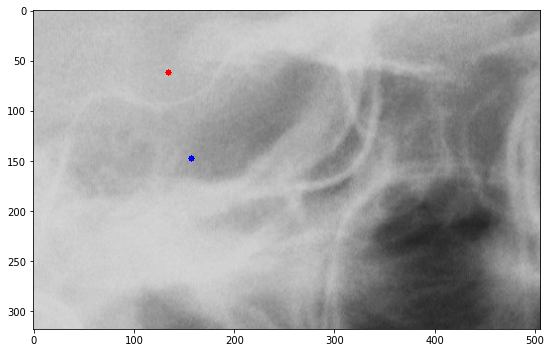

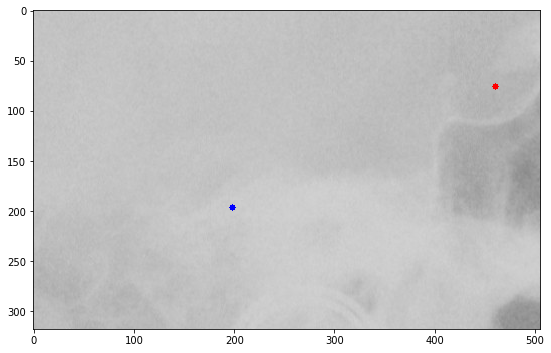

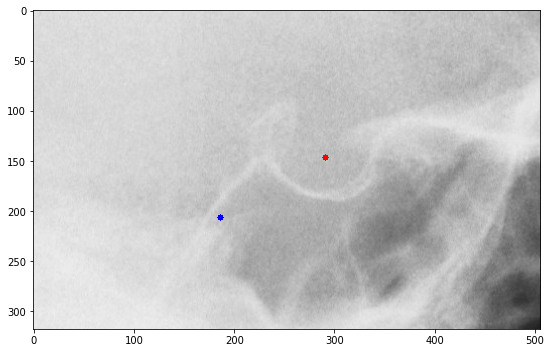

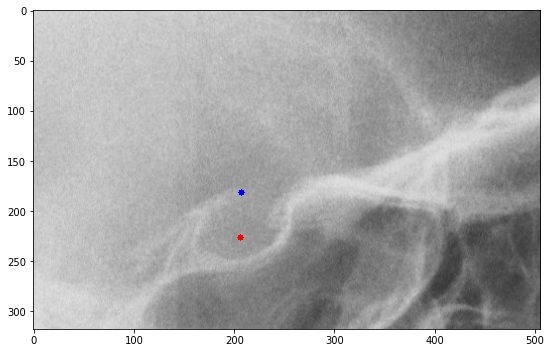

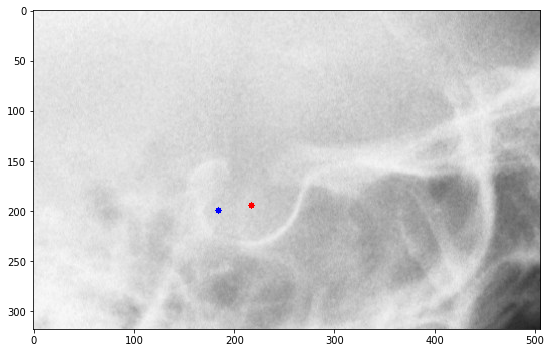

...

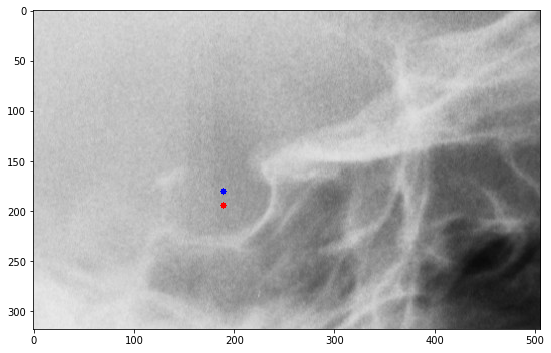

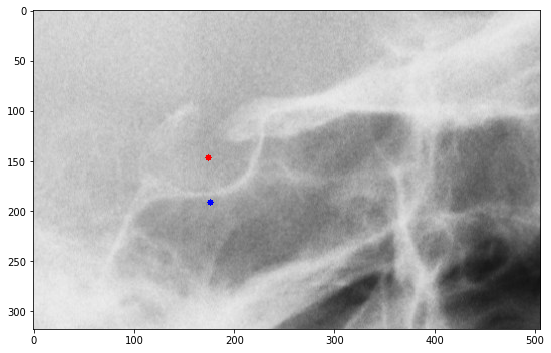

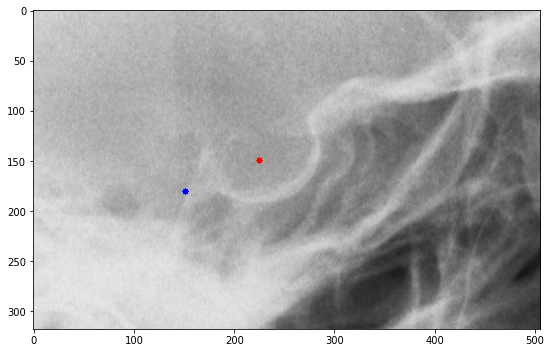

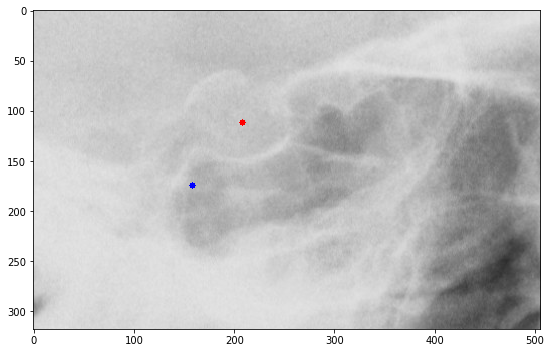

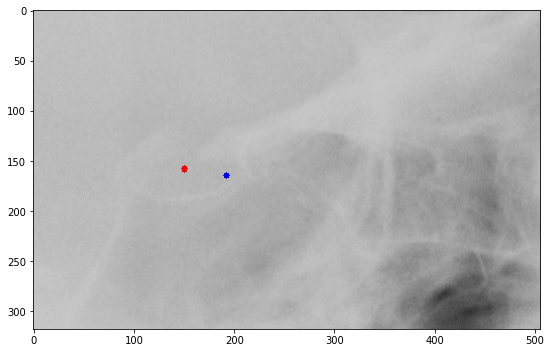

In [24]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
test_bc = []
import cv2
testset=np.load('/data/private/SU/jh/GC_Data/test.npy')

for i in range(100):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    a=cv2.circle(testset[i],(finaltestroi[i][1],finaltestroi[i][0]),3,(255,0,0),-1)
    b=cv2.circle(testset[i],(result1[i][1],result1[i][0]),3,(0,0,255),-1)
    test_bc.append(b)
    plt.imshow(b)
    plt.show()

In [39]:
distance1  = np.sort(distance1)
np.delete(distance1, 99)

dis_ste = np.std(distance1)
dis_mean = np.mean(distance1)

for i in range(100):
    print(distance1[i], dis_mean)

3.417686509195854 78.76386562704563
3.563923144099831 78.76386562704563
3.863470855767928 78.76386562704563
13.078882237402103 78.76386562704563
13.113951352328321 78.76386562704563
13.476759387431862 78.76386562704563
15.563966226951687 78.76386562704563
18.56478818381496 78.76386562704563
18.730229738225052 78.76386562704563
20.54570346768823 78.76386562704563
20.77725785674465 78.76386562704563
21.897307718470383 78.76386562704563
22.185674094240177 78.76386562704563
24.16533661488806 78.76386562704563
25.2271286246783 78.76386562704563
25.960947445924543 78.76386562704563
27.589431593756704 78.76386562704563
28.389223102855507 78.76386562704563
31.975374233949164 78.76386562704563
32.137442026228655 78.76386562704563
32.59136779899068 78.76386562704563
32.59693667267633 78.76386562704563
32.66768809968666 78.76386562704563
35.21056806148091 78.76386562704563
35.803044311246374 78.76386562704563
38.397113816064525 78.76386562704563
42.55806914964309 78.76386562704563
42.593921572198

In [ ]:
a